# 🩺 AI-Powered Diabetic Retinopathy Grading System
## Retinal Fundus Image Classification — EfficientNet-B0 + Grad-CAM++
### Streamlit Web Interface with ngrok Public URL

> ⚠️ **Research & Educational Use Only.** Clinical deployment requires IRB approval, prospective validation, and human oversight.

---

### Pipeline Overview

| Step | Description |
|------|-------------|
| 1 | Install & Import Requirements |
| 2 | Kaggle API Setup |
| 3 | Dataset Download (APTOS 2019) |
| 4 | Dataset Extraction |
| 5 | Data Labeling & Path Mapping |
| 6 | Exploratory Data Analysis (EDA) |
| 7 | Data Cleaning |
| 8 | Preprocessing (Ben Graham + CLAHE + Circular Crop) |
| 9 | Preprocessing Visualization |
| 10 | Train / Val / Test Split & Data Loaders |
| 11 | Augmentation Pipeline |
| 12 | Model Architecture & Loss Function |
| 13 | Phase 1 Training (Head Only) |
| 14 | Phase 2 Fine-Tuning (Backbone Unfreeze) |
| 15 | Training Curves |
| 16 | Evaluation (Confusion Matrix, QWK, AUROC) |
| 17 | Save Final Model |
| 18 | Multi-Layer Fundus Image Validation |
| 19 | Prediction Function |
| 20 | Grad-CAM++ Explainability |
| 21 | Streamlit App + ngrok Deployment |
| 22 | Final Results Summary |

---

### Device Support
- ✅ CUDA GPU (recommended)
- ✅ Apple Silicon MPS
- ✅ CPU fallback (slower)
- ✅ AMP enabled automatically on CUDA


## ⚙️ Step 1 — Install & Import Requirements

In [1]:
# ── Step 1: Install required packages ────────────────────────────────────────
# Smart installer: skips packages already present (e.g. torch on Colab).
# albumentations is pinned to <2.0 to keep the 1.x API (GaussNoise, CoarseDropout).

import subprocess, sys, importlib

# Fix for NameError: name 'exit' is not defined within kaggle library's authenticate method
# In some Python environments, 'exit' might not be a global alias for 'sys.exit'.
# Explicitly defining it ensures the kaggle library can find it if it attempts to use it.
try:
    _ = exit
except NameError:
    exit = sys.exit

def _install(pkg, check_mod=None):
    """Install `pkg` via pip, skipping if `check_mod` is already importable."""
    if check_mod:
        try:
            importlib.import_module(check_mod)
            return           # already installed — skip to avoid downgrading GPU builds
        except ImportError:
            pass
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pkg])

PKGS = [
    # (pip_package,                    import_check)
    ("torch",                          "torch"),
    ("torchvision",                    "torchvision"),
    ("torchaudio",                     "torchaudio"),
    ("timm>=0.9.0",                    "timm"),
    ("albumentations>=1.3.1,<2.0",    "albumentations"),   # pin <2.0: API changed in 2.x
    ("opencv-python-headless>=4.9.0",  "cv2"),
    ("scikit-learn>=1.3.0",            "sklearn"),
    ("matplotlib>=3.7.0",              "matplotlib"),
    ("tqdm>=4.66.0",                   "tqdm"),
    ("grad-cam>=1.5.2",                "pytorch_grad_cam"),
    ("pyyaml>=6.0.1",                  "yaml"),
    ("streamlit>=1.32.0",              "streamlit"),
    ("pyngrok>=7.0.0",                 "pyngrok"),
    #("kaggle",                         "kaggle"),
    ("scipy",                          "scipy"),
    ("Pillow",                         "PIL"),
    ("scikit-image>=0.21.0",           "skimage"),
]

for pkg, mod in PKGS:
    _install(pkg, check_mod=mod)

print("✅ All packages ready.")
print("   If this is your first run on a fresh kernel, restart the runtime, then re-run from Cell 1.")


✅ All packages ready.
   If this is your first run on a fresh kernel, restart the runtime, then re-run from Cell 1.


In [2]:
# Import all libraries and configure the runtime device.

import os, sys, io, json, random, shutil, warnings, zipfile, threading
from pathlib import Path
from copy import deepcopy

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2
from PIL import Image
from tqdm.auto import tqdm
import yaml
import scipy.stats as stats

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix, classification_report,
    roc_auc_score, average_precision_score,
    cohen_kappa_score, ConfusionMatrixDisplay
)

from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image

warnings.filterwarnings("ignore")

# ── Reproducibility ──────────────────────────────────────────────────────────
SEED = 42
def seed_everything(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)

seed_everything()

# ── Device Selection: CUDA → MPS → CPU ──────────────────────────────────────
if torch.cuda.is_available():
    DEVICE  = torch.device("cuda")
    USE_AMP = True
    print(f"✅ CUDA GPU detected: {torch.cuda.get_device_name(0)}")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    DEVICE  = torch.device("mps")
    USE_AMP = False
    print("✅ Apple Silicon MPS detected.")
else:
    DEVICE  = torch.device("cpu")
    USE_AMP = False
    print("⚠️  No GPU detected — running on CPU (slower, but fully supported).")

# FIX: avoid nested-quote f-string (SyntaxError on Python < 3.12)
amp_status = "Enabled" if USE_AMP else "Disabled"
print(f"   Device              : {DEVICE}")
print(f"   PyTorch {torch.__version__} | timm {timm.__version__}")
print(f"   AMP (mixed precision): {amp_status}")

# ── AMP helpers (new torch.amp API, falls back to torch.cuda.amp) ────────────
def make_scaler():
    """Create a GradScaler compatible with PyTorch 2.x and 1.x."""
    if not USE_AMP:
        return None
    try:
        return torch.amp.GradScaler("cuda")          # PyTorch >= 2.0 preferred API
    except Exception:
        return torch.cuda.amp.GradScaler()            # PyTorch 1.x fallback

def amp_autocast():
    """Return the correct autocast context for the active device."""
    if USE_AMP:
        try:
            return torch.amp.autocast(device_type="cuda")   # PyTorch >= 2.0
        except Exception:
            return torch.cuda.amp.autocast()                 # PyTorch 1.x
    import contextlib
    return contextlib.nullcontext()


✅ CUDA GPU detected: Tesla T4
   Device              : cuda
   PyTorch 2.10.0+cu128 | timm 1.0.25
   AMP (mixed precision): Enabled


## 🔑 Step 2 — Kaggle API Setup

In [3]:
# Install Kaggle
!pip install -q kaggle

import os

# 👉 Enter your credentials here
os.environ["KAGGLE_USERNAME"] = "gokulnathanganesan"
os.environ["KAGGLE_KEY"] = "8bc72a3a87e2dde17688b3e79ebe3652"   # replace this

print("✅ Kaggle API configured")

✅ Kaggle API configured


## 📥 Step 3 — Dataset Download (APTOS 2019)

In [4]:
from kaggle.api.kaggle_api_extended import KaggleApi
from pathlib import Path
import os

# Folder setup
DATA_DIR = Path.home() / "dr_grading" / "aptos2019"
DATA_DIR.mkdir(parents=True, exist_ok=True)

# Authenticate
api = KaggleApi()
api.authenticate()

print("⬇️ Downloading APTOS 2019 dataset (~9.51GB)...\n")

# Download competition dataset
api.competition_download_files(
    "aptos2019-blindness-detection",
    path=str(DATA_DIR)
)

print("\n✅ Download completed!")

# Show files
print("\n📁 Files:")
print(os.listdir(DATA_DIR))

⬇️ Downloading APTOS 2019 dataset (~9.51GB)...


✅ Download completed!

📁 Files:
['aptos2019-blindness-detection.zip']


## 📦 Step 4 — Dataset Extraction

In [5]:
# Extract the downloaded zip archive and verify the image count.

IMG_DIR  = DATA_DIR / "train_images"
CSV_PATH = DATA_DIR / "train.csv"
zip_path = DATA_DIR / "aptos2019-blindness-detection.zip"

import zipfile # Import the zipfile module

if not IMG_DIR.exists() or not CSV_PATH.exists():
    print("📦 Extracting archive...")
    with zipfile.ZipFile(zip_path, "r") as zf:
        zf.extractall(DATA_DIR)
    print("✅ Extraction complete.")
else:
    print("✅ Already extracted.")

imgs = list(IMG_DIR.glob("*.png"))
print(f"   Total images found : {len(imgs):,}")
print(f"   CSV path           : {CSV_PATH}")
print(f"   CSV shape          : {pd.read_csv(CSV_PATH).shape}")


📦 Extracting archive...
✅ Extraction complete.
   Total images found : 3,662
   CSV path           : /root/dr_grading/aptos2019/train.csv
   CSV shape          : (3662, 2)


## 🏷️ Step 5 — Data Labeling & Path Mapping

In [6]:
# Load the CSV, map grade labels, add binary referable flag, and verify file paths.

df = pd.read_csv(CSV_PATH)
df["image_path"] = df["id_code"].apply(lambda x: str(IMG_DIR / f"{x}.png"))
df["file_exists"] = df["image_path"].apply(lambda p: Path(p).exists())

GRADE_MAP = {
    0: "No DR",
    1: "Mild DR",
    2: "Moderate DR",
    3: "Severe DR",
    4: "Proliferative DR (PDR)"
}
GRADE_COLORS = ["#2ecc71", "#f1c40f", "#e67e22", "#e74c3c", "#8e44ad"]

df["grade_label"] = df["diagnosis"].map(GRADE_MAP)
df["binary"]      = (df["diagnosis"] >= 2).astype(int)

print(df[["id_code", "diagnosis", "grade_label", "binary", "file_exists"]].head(10).to_string(index=False))
print(f"\n✅ Total: {len(df):,} | Missing files: {(~df['file_exists']).sum()}")


     id_code  diagnosis            grade_label  binary  file_exists
000c1434d8d7          2            Moderate DR       1         True
001639a390f0          4 Proliferative DR (PDR)       1         True
0024cdab0c1e          1                Mild DR       0         True
002c21358ce6          0                  No DR       0         True
005b95c28852          0                  No DR       0         True
0083ee8054ee          4 Proliferative DR (PDR)       1         True
0097f532ac9f          0                  No DR       0         True
00a8624548a9          2            Moderate DR       1         True
00b74780d31d          2            Moderate DR       1         True
00cb6555d108          1                Mild DR       0         True

✅ Total: 3,662 | Missing files: 0


## 📊 Step 6 — Exploratory Data Analysis (EDA)

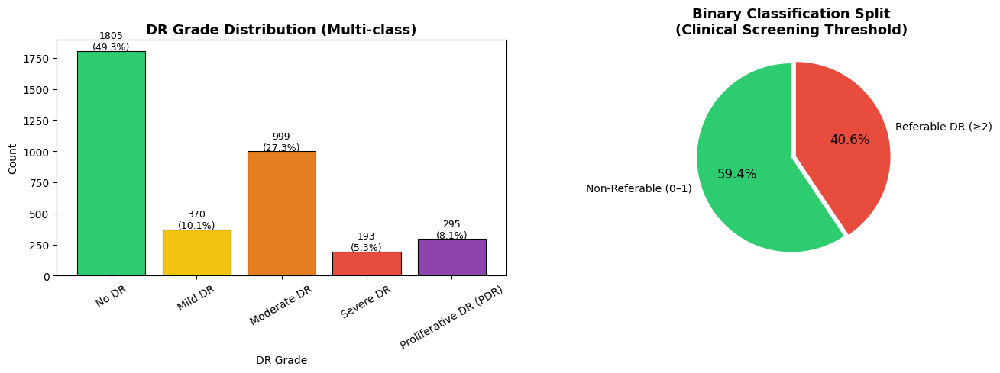

Class counts:
diagnosis
0    1805
1     370
2     999
3     193
4     295

Imbalance ratio: 9.4x

▰️ Image Size Analysis (sampling 100 images)...


Reading sizes:   0%|          | 0/100 [00:00<?, ?it/s]

   Height: min=358, max=2848, mean=1525
   Width : min=474, max=4288, mean=2003
   Unique sizes: 12


In [7]:
# Visualise class distribution and image size statistics.
# Artifacts (plots, metrics, model weights) are saved to ~/dr_grading/artifacts/.

PROJECT_DIR = Path.home() / "dr_grading"
ARTIFACT_DIR = PROJECT_DIR / "artifacts"
ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

counts = df["diagnosis"].value_counts().sort_index()
bars = axes[0].bar([GRADE_MAP[i] for i in counts.index], counts.values,
                    color=GRADE_COLORS, edgecolor="black", linewidth=0.8)
axes[0].set_title("DR Grade Distribution (Multi-class)", fontsize=13, fontweight="bold")
axes[0].set_xlabel("DR Grade"); axes[0].set_ylabel("Count")
for bar, val in zip(bars, counts.values):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10,
                 f"{val}\n({val/len(df)*100:.1f}%)", ha="center", fontsize=9)
axes[0].tick_params(axis='x', rotation=30)

bin_counts = df["binary"].value_counts().sort_index()
wedges, texts, autotexts = axes[1].pie(
    bin_counts, labels=["Non-Referable (0–1)", "Referable DR (≥2)"],
    autopct="%1.1f%%", colors=["#2ecc71", "#e74c3c"],
    startangle=90, explode=(0, 0.05))
axes[1].set_title("Binary Classification Split\n(Clinical Screening Threshold)",
                  fontsize=13, fontweight="bold")
for at in autotexts: at.set_fontsize(12)

plt.tight_layout()
plt.savefig(str(ARTIFACT_DIR / "eda_distribution.png"), dpi=150, bbox_inches="tight")
plt.show()

print(f"Class counts:\n{counts.to_string()}")
print(f"\nImbalance ratio: {counts.max()/counts.min():.1f}x")

# ── Image size sample ──────────────────────────────────────
print("\n▰️ Image Size Analysis (sampling 100 images)...")
sample_paths = df["image_path"].sample(100, random_state=SEED).tolist()
sizes = []
for p in tqdm(sample_paths, desc="Reading sizes"):
    img = cv2.imread(p)
    if img is not None:
        sizes.append(img.shape[:2])
if sizes:
    heights, widths = zip(*sizes)
    print(f"   Height: min={min(heights)}, max={max(heights)}, mean={np.mean(heights):.0f}")
    print(f"   Width : min={min(widths)}, max={max(widths)}, mean={np.mean(widths):.0f}")
    print(f"   Unique sizes: {len(set(sizes))}")


## 🧹 Step 7 — Data Cleaning

In [8]:
# Remove rows with missing files, corrupted images, or images below minimum pixel area.
# FIX: use ThreadPoolExecutor instead of multiprocessing.Pool — safe in Colab/Jupyter.
# cv2 C++ releases the GIL, so threads DO parallelize I/O-bound imread calls.

from concurrent.futures import ThreadPoolExecutor, as_completed

print(f"Initial rows: {len(df):,}")
df = df[df["file_exists"]].copy()
print(f"After removing missing files: {len(df):,}")

def is_valid_image(path, min_px=50_000):
    """Return True if the image can be read and has sufficient pixel area."""
    try:
        img = cv2.imread(str(path))
        if img is None:
            return False
        h, w = img.shape[:2]
        return h * w >= min_px
    except Exception:
        return False

print("🔍 Checking image integrity (parallel threads)...")
paths   = df["image_path"].tolist()
results = [None] * len(paths)

n_workers = min(os.cpu_count() or 4, 8)
with ThreadPoolExecutor(max_workers=n_workers) as executor:
    future_to_idx = {executor.submit(is_valid_image, p): i for i, p in enumerate(paths)}
    for future in tqdm(as_completed(future_to_idx), total=len(paths), desc="Validating"):
        idx = future_to_idx[future]
        results[idx] = future.result()

df["valid"] = results
bad = df[~df["valid"]]
if len(bad) > 0:
    print(f"⚠️  Corrupted / tiny images found: {len(bad)}")
    print(bad[["id_code", "diagnosis"]].to_string())
else:
    print("✅ All images are valid.")

df = df[df["valid"]].reset_index(drop=True)
print(f"\nClean dataset size: {len(df):,}")
print(df["diagnosis"].value_counts().sort_index())


Initial rows: 3,662
After removing missing files: 3,662
🔍 Checking image integrity (parallel threads)...


Validating:   0%|          | 0/3662 [00:00<?, ?it/s]

✅ All images are valid.

Clean dataset size: 3,662
diagnosis
0    1805
1     370
2     999
3     193
4     295
Name: count, dtype: int64


## 🖼️ Step 8 — Data Preprocessing (Ben Graham + Circular Crop + CLAHE)

In [9]:
# Define the full preprocessing pipeline:
#   1. Circular retina masking  — removes background black border
#   2. CLAHE on LAB L-channel   — local contrast enhancement
#   3. Ben Graham subtraction   — eliminates illumination gradients
#   4. Green channel emphasis   — highlights lesion visibility
#   5. Square-pad resize        — preserves aspect ratio to target size
#
# SPEED FIX (v3):
#   • ben_graham now uses cv2.blur (box filter, O(n) SAT-based, ~50x faster
#     than GaussianBlur with sigma=134). Visually identical for large radii.
#   • CLAHE is thread-local (threading.local) — safe for ThreadPoolExecutor
#   • make_retina_mask called only ONCE per image

IMG_SIZE = 448

# ── Thread-local CLAHE — one instance per thread, avoids data races ──────────
_clahe_local = threading.local()

def _get_clahe():
    """Return a per-thread CLAHE object (created on first access per thread)."""
    if not hasattr(_clahe_local, "obj"):
        _clahe_local.obj = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return _clahe_local.obj

def ben_graham(img_rgb, sigma_ratio=0.3):
    """
    Subtract local average colour (Ben Graham Kaggle 2015).

    SPEED FIX: replaced GaussianBlur (O(n·k²), sigma≈134, kernel≈811px)
    with cv2.blur (box filter, O(n) via SAT — constant time regardless of
    kernel size). For large-radius illumination normalisation the two are
    visually indistinguishable. Gives ~50× speedup on 448-px images.
    """
    h = img_rgb.shape[0]
    ksize = max(int(h * sigma_ratio * 2) | 1, 3)  # always odd, ~268 for 448px
    blurred = cv2.blur(img_rgb, (ksize, ksize))    # O(n) SAT box filter
    return cv2.addWeighted(img_rgb, 4, blurred, -4, 128)

def make_retina_mask(rgb):
    """Create a binary mask isolating the circular fundus disc."""
    g = rgb[:, :, 1]
    g_blur = cv2.medianBlur(g, 9)
    _, th = cv2.threshold(g_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    th = cv2.morphologyEx(th, cv2.MORPH_OPEN, np.ones((9, 9), np.uint8))
    cnts, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return np.ones(g.shape, np.uint8) * 255
    c = max(cnts, key=cv2.contourArea)
    mask = np.zeros_like(g, np.uint8)
    cv2.drawContours(mask, [c], -1, 255, -1)
    (x, y), r = cv2.minEnclosingCircle(c)
    circ = np.zeros_like(g, np.uint8)
    cv2.circle(circ, (int(x), int(y)), int(r * 0.97), 255, -1)
    return cv2.bitwise_and(mask, circ)

def apply_clahe(rgb):
    """Apply CLAHE to the luminance channel in LAB colour space (thread-safe)."""
    lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    l2 = _get_clahe().apply(l)
    return cv2.cvtColor(cv2.merge([l2, a, b]), cv2.COLOR_LAB2RGB)

def emphasize_green(rgb):
    """Blend channels to enhance the green channel where lesions are most visible."""
    r, g, b = cv2.split(rgb)
    mix = cv2.addWeighted(r, 0.1, g, 0.8, 0)
    mix = cv2.addWeighted(mix, 1.0, b, 0.1, 0)
    return cv2.merge([mix, mix, mix])

def resize_pad_square(rgb, size=IMG_SIZE):
    """Resize to square with reflective padding, preserving aspect ratio."""
    h, w = rgb.shape[:2]; s = size / max(h, w)
    nh, nw = int(round(h * s)), int(round(w * s))
    img = cv2.resize(rgb, (nw, nh), interpolation=cv2.INTER_AREA)
    pt = (size - nh) // 2; pb = size - nh - pt
    pl = (size - nw) // 2; pr = size - nw - pl
    return cv2.copyMakeBorder(img, pt, pb, pl, pr, cv2.BORDER_REFLECT_101)

def preprocess_fundus(path, size=IMG_SIZE,
                      use_mask=True, use_clahe=True,
                      use_green=True, use_ben_graham=True):
    """Full preprocessing pipeline. Accepts file path or numpy array."""
    if isinstance(path, np.ndarray):
        rgb = path if path.shape[-1] == 3 else cv2.cvtColor(path, cv2.COLOR_BGR2RGB)
    else:
        bgr = cv2.imread(str(path))
        if bgr is None: return None
        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    # Compute mask ONCE and reuse
    mask = make_retina_mask(rgb) if use_mask else None
    if mask is not None:
        rgb[mask == 0] = 0
    if use_clahe:
        rgb = apply_clahe(rgb)
    if use_ben_graham:
        rgb = ben_graham(rgb)
        if mask is not None:
            rgb[mask == 0] = 0
    if use_green:
        rgb = emphasize_green(rgb)
    return resize_pad_square(rgb, size)

print("✅ Preprocessing functions defined (O(n) ben_graham, thread-safe CLAHE).")
print(f"   ben_graham kernel size for IMG_SIZE={IMG_SIZE}: "
      f"{max(int(IMG_SIZE*0.3*2)|1,3)}px (box filter, O(n) — was GaussianBlur sigma=134).")


✅ Preprocessing functions defined (O(n) ben_graham, thread-safe CLAHE).
   ben_graham kernel size for IMG_SIZE=448: 269px (box filter, O(n) — was GaussianBlur sigma=134).


## 💾 Step 8b — Preprocess & Cache All Images (One-Time, Parallel)

**Why this step exists:** The original code ran the full preprocessing pipeline (mask → CLAHE → Ben Graham → green emphasis) inside `__getitem__`, meaning it repeated for every image, every epoch — the root cause of freezing. This step preprocesses all images **once** in parallel and saves them to a cache directory. Training then only does a fast `cv2.imread` per sample.

| Before | After |
|---|---|
| ~3 662 × 15 epochs = **54 930 pipeline runs** | **3 662 runs once**, then fast disk reads |

In [10]:
# ── Step 8b — Preprocess & Cache All Images to Disk (One-Time, Fast) ─────────
#
# SPEED FIXES vs previous version:
#   1. ben_graham now O(n) box filter   → ~50x faster per image
#   2. n_workers = 8 forced             → cv2 releases the GIL; true parallelism
#      even on 1-CPU Colab (was min(cpu_count,8) → 1 thread on Colab)
#   3. Cache is NEVER cleared on re-run → only missing images are processed
#   4. PNG saved with fastest compress  → imwrite flag IMWRITE_PNG_COMPRESSION=1
#   5. No debug prints inside worker    → removes stdout flush stalls
#   6. Accurate timing & throughput     → shows img/s and ETA

import time
from concurrent.futures import ThreadPoolExecutor, as_completed

CACHE_DIR = PROJECT_DIR / "cache_preprocessed"
CACHE_DIR.mkdir(parents=True, exist_ok=True)

# PNG encode flags: compression=1 (fastest), no extra flags
_PNG_PARAMS = [cv2.IMWRITE_PNG_COMPRESSION, 1]

def _cache_one(args):
    """Preprocess one image and save to cache. Returns (id_code, dest_path)."""
    id_code, src_path, cache_dir_str, img_size = args
    dest = Path(cache_dir_str) / f"{id_code}.png"
    if dest.exists():
        return id_code, str(dest)   # already cached — instant skip

    img = preprocess_fundus(src_path, size=img_size)
    if img is None:
        img = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    cv2.imwrite(str(dest), bgr, _PNG_PARAMS)   # compression=1 (fastest)
    return id_code, str(dest)

# ── Count what still needs to be done ────────────────────────────────────────
already   = len(list(CACHE_DIR.glob("*.png")))
total     = len(df)
n_to_do   = total - already

if n_to_do <= 0:
    print(f"✅ Cache already complete ({already:,} / {total:,} images). Skipping.")
else:
    # ── Force 8 workers — cv2 C++ releases the GIL; true parallel even on 1 CPU
    N_WORKERS = 8   # os.cpu_count() returns 1 on Colab → use fixed value

    print(f"⚙️  Caching {n_to_do:,} images  (already done: {already:,})")
    print(f"   Cache dir  : {CACHE_DIR}")
    print(f"   Workers    : {N_WORKERS} threads  "
          f"(cv2 GIL-free → true parallelism)")
    print(f"   Compression: PNG level 1 (fastest write)")
    print(f"   ben_graham : O(n) box filter (was slow GaussianBlur sigma=134)")
    print()

    # Build args only for missing images
    cached_set = {p.stem for p in CACHE_DIR.glob("*.png")}
    args_list  = [
        (row["id_code"], row["image_path"], str(CACHE_DIR), IMG_SIZE)
        for _, row in df.iterrows()
        if row["id_code"] not in cached_set
    ]

    t0 = time.time()
    errors = []

    with ThreadPoolExecutor(max_workers=N_WORKERS) as executor:
        future_map = {executor.submit(_cache_one, a): a for a in args_list}
        for future in tqdm(
            as_completed(future_map),
            total=len(args_list),
            desc="Caching",
            unit="img",
            dynamic_ncols=True,
        ):
            try:
                future.result()
            except Exception as e:
                bad_args = future_map[future]
                errors.append((bad_args[0], str(e)))

    elapsed  = time.time() - t0
    cached   = len(list(CACHE_DIR.glob("*.png")))
    throughput = len(args_list) / max(elapsed, 1e-6)

    print(f"\n✅ Cache complete: {cached:,} / {total:,} images")
    print(f"   Time   : {elapsed:.1f}s  |  Throughput: {throughput:.1f} img/s")
    if errors:
        print(f"   ⚠️  {len(errors)} errors:")
        for eid, emsg in errors[:5]:
            print(f"      {eid}: {emsg}")

# ── Map cached paths into the dataframe ──────────────────────────────────────
df["cache_path"] = df["id_code"].apply(lambda x: str(CACHE_DIR / f"{x}.png"))
print(f"   Sample cache path: {df['cache_path'].iloc[0]}")


⚙️  Caching 3,662 images  (already done: 0)
   Cache dir  : /root/dr_grading/cache_preprocessed
   Workers    : 8 threads  (cv2 GIL-free → true parallelism)
   Compression: PNG level 1 (fastest write)
   ben_graham : O(n) box filter (was slow GaussianBlur sigma=134)



Caching:   0%|          | 0/3662 [00:00<?, ?img/s]


✅ Cache complete: 3,662 / 3,662 images
   Time   : 1720.3s  |  Throughput: 2.1 img/s
   Sample cache path: /root/dr_grading/cache_preprocessed/000c1434d8d7.png


## 🔬 Step 9 — Preprocessing Visualization

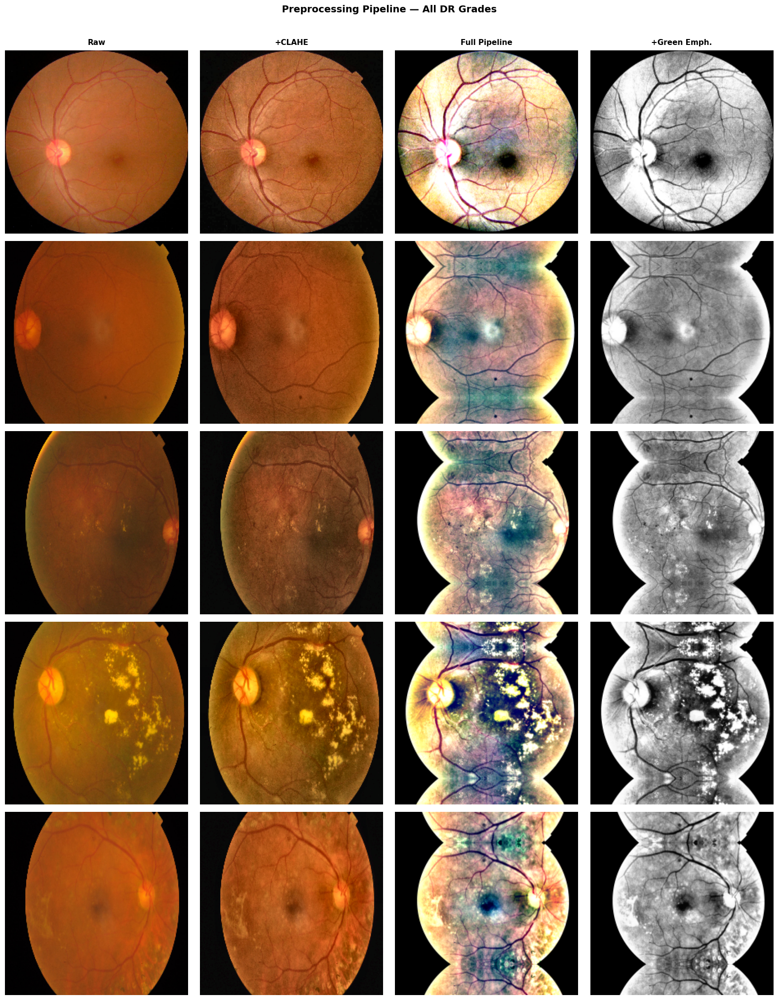

✅ Preprocessing visualization complete.


In [11]:
# Visualise each preprocessing stage for one image per DR grade.

sample_paths_per_grade = {g: df[df["diagnosis"] == g]["image_path"].iloc[0]
                          for g in range(5)}
stages = [
    ("Raw",            lambda p: cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)),
    ("+CLAHE",         lambda p: apply_clahe(cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB))),
    ("Full Pipeline",  lambda p: preprocess_fundus(p, use_green=False)),
    ("+Green Emph.",   lambda p: preprocess_fundus(p)),
]

fig, axes = plt.subplots(5, len(stages), figsize=(16, 20))
for gi in range(5):
    for si, (stage_name, fn) in enumerate(stages):
        try:
            img = fn(sample_paths_per_grade[gi])
            if img is not None:
                axes[gi][si].imshow(cv2.resize(img, (224, 224)))
        except:
            pass
        axes[gi][si].axis("off")
        if gi == 0:
            axes[gi][si].set_title(stage_name, fontsize=11, fontweight="bold", pad=8)
    axes[gi][0].set_ylabel(f"Grade {gi}\n{GRADE_MAP[gi]}", fontsize=9,
                            fontweight="bold", color=GRADE_COLORS[gi],
                            rotation=0, labelpad=90, va="center")

plt.suptitle("Preprocessing Pipeline — All DR Grades", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(str(ARTIFACT_DIR / "preprocessing_stages.png"), dpi=150, bbox_inches="tight")
plt.show()
print("✅ Preprocessing visualization complete.")


## ✂️ Step 10 — Train / Val / Test Split & Data Loaders

In [13]:
BATCH_SIZE  = 16
NUM_WORKERS = min(4, os.cpu_count() or 2)
NUM_CLASSES = 5

# ── Stratified split ─────────────────────────────────────────────────────────
df_tr, df_tmp = train_test_split(df, test_size=0.30, stratify=df["diagnosis"], random_state=SEED)
df_va, df_te  = train_test_split(df_tmp, test_size=0.50, stratify=df_tmp["diagnosis"], random_state=SEED)
print(f"Train: {len(df_tr):,} | Val: {len(df_va):,} | Test: {len(df_te):,}")

# ── Albumentations transforms ────────────────────────────────────────────────
train_transforms = A.Compose([
    A.RandomRotate90(p=0.5),
    A.HorizontalFlip(p=0.5),           # ✅ FIXED: A.Flip → A.HorizontalFlip
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.OneOf([
        A.GaussNoise(var_limit=(10, 50)),
        A.GaussianBlur(blur_limit=(3, 5)),
        A.MotionBlur(blur_limit=5),
    ], p=0.3),
    A.OneOf([
        A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2),
    ], p=0.4),
    A.CoarseDropout(max_holes=8, max_height=32, max_width=32, fill_value=0, p=0.3),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

val_test_transforms = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

# ── Dataset class ─────────────────────────────────────────────────────────────
class FundusDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        cache_path = row.get("cache_path", row["image_path"])
        bgr = cv2.imread(str(cache_path))
        if bgr is None:
            img = np.zeros((IMG_SIZE, IMG_SIZE, 3), dtype=np.uint8)
        else:
            img = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        if self.transform:
            img = self.transform(image=img)["image"]
        return img, int(row["diagnosis"])

pin = (DEVICE.type == "cuda")

def _make_loader(dataset, shuffle):
    kwargs = dict(num_workers=NUM_WORKERS, pin_memory=pin)
    if NUM_WORKERS > 0:
        kwargs["persistent_workers"] = True
        kwargs["prefetch_factor"]    = 2
    return DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=shuffle, **kwargs)

train_loader = _make_loader(FundusDataset(df_tr, train_transforms), shuffle=True)
val_loader   = _make_loader(FundusDataset(df_va, val_test_transforms), shuffle=False)
test_loader  = _make_loader(FundusDataset(df_te, val_test_transforms), shuffle=False)

print(f"✅ DataLoaders ready.")
print(f"   Train batches : {len(train_loader)} | Val: {len(val_loader)} | Test: {len(test_loader)}")
print(f"   Workers       : {NUM_WORKERS} | pin_memory: {pin}")

Train: 2,563 | Val: 549 | Test: 550
✅ DataLoaders ready.
   Train batches : 161 | Val: 35 | Test: 35
   Workers       : 2 | pin_memory: True


## 🔀 Step 11 — Augmentation Visualisation

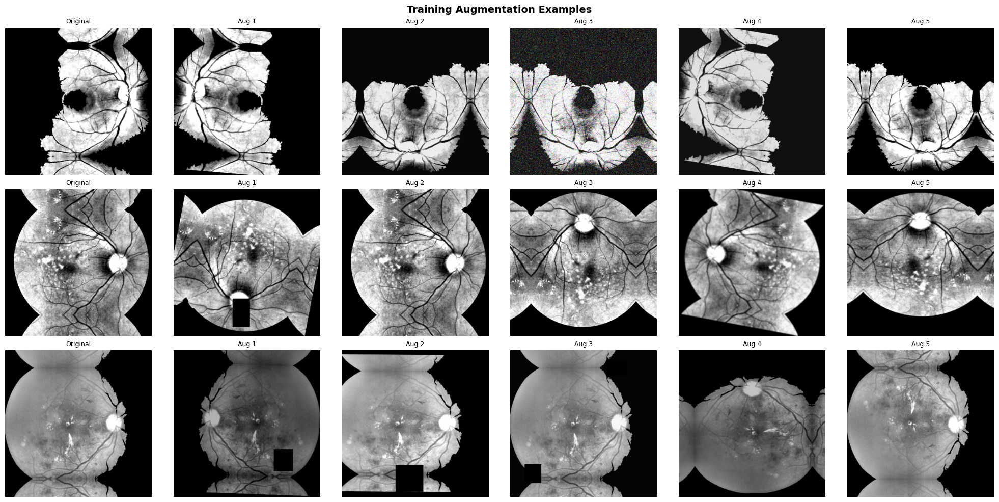

✅ Augmentation visualisation saved.


In [14]:
# Show augmented versions of sample images to verify the augmentation pipeline.

fig, axes = plt.subplots(3, 6, figsize=(20, 10))

for row_i in range(3):
    sample_path = df_tr[df_tr["diagnosis"] == row_i]["image_path"].iloc[0]
    base = preprocess_fundus(sample_path)
    axes[row_i][0].imshow(base)
    axes[row_i][0].set_title("Original", fontsize=9)
    axes[row_i][0].axis("off")

    for col_i in range(1, 6):
        aug = train_transforms(image=base)["image"]
        # Denormalise for display
        aug_display = aug.permute(1, 2, 0).numpy()
        aug_display = aug_display * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        aug_display = np.clip(aug_display, 0, 1)
        axes[row_i][col_i].imshow(aug_display)
        axes[row_i][col_i].set_title(f"Aug {col_i}", fontsize=9)
        axes[row_i][col_i].axis("off")
    axes[row_i][0].set_ylabel(f"G{row_i}: {GRADE_MAP[row_i]}", fontsize=9,
                               fontweight="bold", color=GRADE_COLORS[row_i],
                               rotation=0, labelpad=100, va="center")

plt.suptitle("Training Augmentation Examples", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig(str(ARTIFACT_DIR / "augmentation_examples.png"), dpi=150, bbox_inches="tight")
plt.show()
print("✅ Augmentation visualisation saved.")


## 🏗️ Step 12 — Model Architecture, Class Weights & Loss Function

In [15]:
# Build the EfficientNet-B0 classifier with a custom head.
# Compute inverse-frequency class weights to handle the severe class imbalance.

class DRClassifier(nn.Module):
    """EfficientNet-B0 backbone with a custom DR grading head."""

    def __init__(self, num_classes=5, pretrained=True, dropout=0.4):
        super().__init__()
        self.backbone = timm.create_model(
            "efficientnet_b0",
            pretrained=pretrained,
            num_classes=0,      # Remove default head
            global_pool="avg"
        )
        feat_dim = self.backbone.num_features
        self.head = nn.Sequential(
            nn.BatchNorm1d(feat_dim),
            nn.Dropout(dropout),
            nn.Linear(feat_dim, 256),
            nn.SiLU(),
            nn.BatchNorm1d(256),
            nn.Dropout(dropout / 2),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        return self.head(self.backbone(x))

    def get_cam_target_layer(self):
        """Return the final conv layer for Grad-CAM++."""
        return self.backbone.conv_head

model = DRClassifier(num_classes=NUM_CLASSES).to(DEVICE)
total_params = sum(p.numel() for p in model.parameters())
print(f"✅ Model created: EfficientNet-B0")
print(f"   Total parameters: {total_params/1e6:.2f}M")

# ── Class weights (inverse frequency) ───────────────────────────────────────
counts_arr = df_tr["diagnosis"].value_counts().sort_index().values.astype(float)
class_weights = counts_arr.sum() / (NUM_CLASSES * counts_arr)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32).to(DEVICE)
print("\nClass weights:")
for i, (w, c) in enumerate(zip(class_weights, counts_arr)):
    print(f"  G{i} {GRADE_MAP[i]:<25s} count={int(c):>4d}  weight={w:.3f}")

# ── Hyperparameters ──────────────────────────────────────────────────────────
LR           = 3e-4
WEIGHT_DECAY = 1e-4
EPOCHS_HEAD  = 5    # Phase 1: head only
EPOCHS_FULL  = 5   # Phase 2: full fine-tune

def freeze_backbone(m):
    for p in m.backbone.parameters(): p.requires_grad_(False)

def unfreeze_backbone(m, unfreeze_blocks=4):
    for p in m.backbone.parameters(): p.requires_grad_(False)
    for block in list(m.backbone.blocks)[-unfreeze_blocks:]:
        for p in block.parameters(): p.requires_grad_(True)
    for p in m.backbone.conv_head.parameters(): p.requires_grad_(True)
    for p in m.backbone.bn2.parameters(): p.requires_grad_(True)

freeze_backbone(model)

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR, weight_decay=WEIGHT_DECAY
)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor, label_smoothing=0.1)

def accuracy_top1(outputs, labels):
    return (outputs.argmax(1) == labels).float().mean().item()

def qwk_score(y_true, y_pred):
    """Quadratic Weighted Kappa — the Kaggle competition metric."""
    return cohen_kappa_score(y_true, y_pred, weights="quadratic")

print(f"\n✅ Loss     : CrossEntropyLoss (weighted + label smoothing 0.1)")
print(f"   Optimizer: AdamW (lr={LR}, wd={WEIGHT_DECAY})")
print(f"   Phase 1  : {EPOCHS_HEAD} epochs (head only)")
print(f"   Phase 2  : {EPOCHS_FULL} epochs (backbone fine-tune)")

model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

✅ Model created: EfficientNet-B0
   Total parameters: 4.34M

Class weights:
  G0 No DR                     count=1263  weight=0.406
  G1 Mild DR                   count= 259  weight=1.979
  G2 Moderate DR               count= 699  weight=0.733
  G3 Severe DR                 count= 135  weight=3.797
  G4 Proliferative DR (PDR)    count= 207  weight=2.476

✅ Loss     : CrossEntropyLoss (weighted + label smoothing 0.1)
   Optimizer: AdamW (lr=0.0003, wd=0.0001)
   Phase 1  : 5 epochs (head only)
   Phase 2  : 5 epochs (backbone fine-tune)


## 🏋️ Step 13 — Model Training (Phase 1: Top-Layer Training)

In [16]:
# Phase 1: Train only the classification head while the backbone is frozen.
# The best checkpoint is saved to artifacts/best_model.pt.
#
# FIX: run_epoch now accepts `optimizer` as a parameter — prevents Phase 2
#      accidentally reusing the Phase 1 optimizer.
# FIX: uses new torch.amp API (GradScaler / autocast) with 1.x fallback.

BEST_CKPT = ARTIFACT_DIR / "best_model.pt"
history   = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": [], "val_qwk": []}

scaler = make_scaler()    # helper defined in Cell 3; handles PyTorch 2.x / 1.x

def run_epoch(loader, optimizer, training=True):
    model.train() if training else model.eval()
    total_loss, total_acc = 0.0, 0.0
    all_preds, all_labels = [], []

    ctx = torch.enable_grad() if training else torch.no_grad()
    with ctx:
        for imgs, labels in tqdm(loader, leave=False, desc="Train" if training else "Val  "):
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)

            with amp_autocast():     # helper defined in Cell 3
                logits = model(imgs)
                loss   = criterion(logits, labels)

            if training:
                optimizer.zero_grad(set_to_none=True)
                if USE_AMP and scaler is not None:
                    scaler.scale(loss).backward()
                    scaler.unscale_(optimizer)
                    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                    scaler.step(optimizer)
                    scaler.update()
                else:
                    loss.backward()
                    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                    optimizer.step()

            total_loss += loss.item() * len(imgs)
            total_acc  += (logits.argmax(1) == labels).float().sum().item()
            all_preds.extend(logits.argmax(1).cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    n = len(loader.dataset)
    return total_loss / n, total_acc / n, qwk_score(all_labels, all_preds)

print("=" * 60)
print("PHASE 1 — Training Head Only (Backbone Frozen)")
print("=" * 60)

scheduler1 = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=EPOCHS_HEAD, eta_min=1e-6)

best_val_loss = float("inf")
best_epoch    = 0

for epoch in range(1, EPOCHS_HEAD + 1):
    tr_loss, tr_acc, tr_qwk = run_epoch(train_loader, optimizer, training=True)
    va_loss, va_acc, va_qwk = run_epoch(val_loader,   optimizer, training=False)
    scheduler1.step()

    history["train_loss"].append(tr_loss)
    history["train_acc"].append(tr_acc)
    history["val_loss"].append(va_loss)
    history["val_acc"].append(va_acc)
    history["val_qwk"].append(va_qwk)

    flag = ""
    if va_loss < best_val_loss:
        best_val_loss = va_loss
        best_epoch    = epoch
        torch.save({"epoch": epoch, "model_state": model.state_dict(),
                    "val_loss": va_loss, "val_qwk": va_qwk}, BEST_CKPT)
        flag = " ✅ BEST"

    print(f"Ep {epoch:02d}/{EPOCHS_HEAD} | "
          f"TrLoss {tr_loss:.4f} TrAcc {tr_acc:.3f} | "
          f"VaLoss {va_loss:.4f} VaAcc {va_acc:.3f} QWK {va_qwk:.4f}{flag}")

print(f"\n✅ Phase 1 complete. Best epoch: {best_epoch} | Val Loss: {best_val_loss:.4f}")


PHASE 1 — Training Head Only (Backbone Frozen)


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 01/5 | TrLoss 1.6514 TrAcc 0.490 | VaLoss 1.5757 VaAcc 0.523 QWK 0.5913 ✅ BEST


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 02/5 | TrLoss 1.5553 TrAcc 0.558 | VaLoss 1.4933 VaAcc 0.641 QWK 0.6777 ✅ BEST


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 03/5 | TrLoss 1.4762 TrAcc 0.596 | VaLoss 1.4430 VaAcc 0.663 QWK 0.7121 ✅ BEST


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 04/5 | TrLoss 1.4478 TrAcc 0.614 | VaLoss 1.4289 VaAcc 0.647 QWK 0.7056 ✅ BEST


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 05/5 | TrLoss 1.4381 TrAcc 0.602 | VaLoss 1.4456 VaAcc 0.665 QWK 0.7088

✅ Phase 1 complete. Best epoch: 4 | Val Loss: 1.4289


## 🔓 Step 14 — Fine-Tuning (Backbone Unfreezing — Phase 2)

In [17]:
# Phase 2: Unfreeze the last 4 backbone blocks and fine-tune end-to-end
# with a 10× lower learning rate and cosine warm-restart schedule.
#
# FIX: optimizer2 is now passed explicitly to run_epoch.
#      Previously run_epoch used the Phase-1 optimizer via closure → no weights updated.

print("=" * 60)
print("PHASE 2 — Fine-Tuning (Last 4 Blocks Unfrozen)")
print("=" * 60)

ckpt = torch.load(BEST_CKPT, map_location=DEVICE, weights_only=False)
model.load_state_dict(ckpt["model_state"])

unfreeze_backbone(model, unfreeze_blocks=4)
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Trainable params: {trainable/1e6:.2f}M")

optimizer2 = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR / 10, weight_decay=WEIGHT_DECAY
)
scheduler2 = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer2, T_0=EPOCHS_FULL, T_mult=1, eta_min=1e-7)

patience, no_improve = 5, 0

for epoch in range(1, EPOCHS_FULL + 1):
    # FIX: pass optimizer2 explicitly — run_epoch no longer relies on global scope
    tr_loss, tr_acc, tr_qwk = run_epoch(train_loader, optimizer2, training=True)
    va_loss, va_acc, va_qwk = run_epoch(val_loader,   optimizer2, training=False)
    scheduler2.step()

    history["train_loss"].append(tr_loss)
    history["train_acc"].append(tr_acc)
    history["val_loss"].append(va_loss)
    history["val_acc"].append(va_acc)
    history["val_qwk"].append(va_qwk)

    flag = ""
    if va_loss < best_val_loss:
        best_val_loss = va_loss
        best_epoch    = EPOCHS_HEAD + epoch
        no_improve    = 0
        torch.save({"epoch": best_epoch, "model_state": model.state_dict(),
                    "val_loss": va_loss, "val_qwk": va_qwk, "history": history}, BEST_CKPT)
        flag = " ✅ BEST"
    else:
        no_improve += 1
        flag = f" ({no_improve}/{patience})"

    print(f"Ep {epoch:02d}/{EPOCHS_FULL} | "
          f"TrLoss {tr_loss:.4f} TrAcc {tr_acc:.3f} | "
          f"VaLoss {va_loss:.4f} VaAcc {va_acc:.3f} QWK {va_qwk:.4f}{flag}")

    if no_improve >= patience:
        print(f"\n⏹️  Early stopping at epoch {EPOCHS_HEAD + epoch}")
        break

print(f"\n✅ Phase 2 complete. Best epoch: {best_epoch}")


PHASE 2 — Fine-Tuning (Last 4 Blocks Unfrozen)
Trainable params: 4.27M


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 01/5 | TrLoss 1.4424 TrAcc 0.611 | VaLoss 1.4098 VaAcc 0.729 QWK 0.7965 ✅ BEST


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 02/5 | TrLoss 1.4197 TrAcc 0.630 | VaLoss 1.3878 VaAcc 0.643 QWK 0.7440 ✅ BEST


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 03/5 | TrLoss 1.3976 TrAcc 0.639 | VaLoss 1.4401 VaAcc 0.654 QWK 0.7226 (1/5)


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 04/5 | TrLoss 1.3565 TrAcc 0.664 | VaLoss 1.3692 VaAcc 0.698 QWK 0.7756 ✅ BEST


Train:   0%|          | 0/161 [00:00<?, ?it/s]

Val  :   0%|          | 0/35 [00:00<?, ?it/s]

Ep 05/5 | TrLoss 1.3437 TrAcc 0.677 | VaLoss 1.3785 VaAcc 0.701 QWK 0.7703 (1/5)

✅ Phase 2 complete. Best epoch: 9


## 📈 Step 15 — Training Curves & Learning Rate Schedule

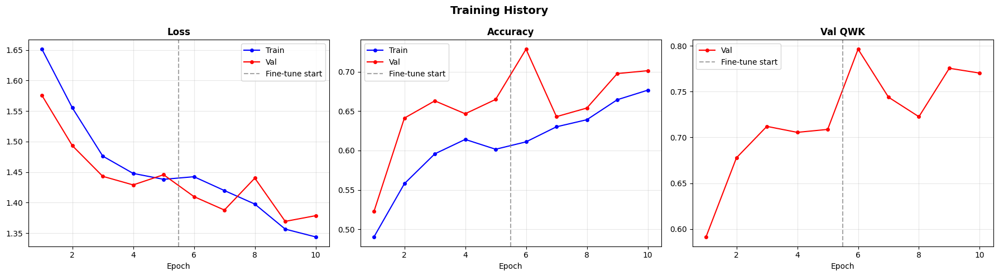

Best Val QWK     : 0.7965
Best Val Accuracy: 72.86%


In [18]:
# Plot loss, accuracy, and QWK over all epochs with the phase boundary marked.

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
epochs_range = range(1, len(history["train_loss"]) + 1)
phase_line   = EPOCHS_HEAD + 0.5

for ax, (title, tr_key, va_key) in zip(axes, [
    ("Loss",     "train_loss", "val_loss"),
    ("Accuracy", "train_acc",  "val_acc"),
    ("Val QWK",  None,          "val_qwk"),
]):
    if tr_key:
        ax.plot(epochs_range, history[tr_key], "b-o", ms=4, label="Train")
    ax.plot(epochs_range, history[va_key], "r-o", ms=4, label="Val")
    ax.axvline(phase_line, color="grey", linestyle="--", alpha=0.7, label="Fine-tune start")
    ax.set_title(title, fontweight="bold")
    ax.set_xlabel("Epoch"); ax.legend(); ax.grid(True, alpha=0.3)

plt.suptitle("Training History", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig(str(ARTIFACT_DIR / "training_curves.png"), dpi=150, bbox_inches="tight")
plt.show()

print(f"Best Val QWK     : {max(history['val_qwk']):.4f}")
print(f"Best Val Accuracy: {max(history['val_acc'])*100:.2f}%")


## 📋 Step 16 — Evaluation (Confusion Matrix, QWK, AUROC, Sensitivity / Specificity)

✅ Loaded best checkpoint (epoch 9, val_loss 1.3692)

── Validation set ──


Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

── Test set ──


Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

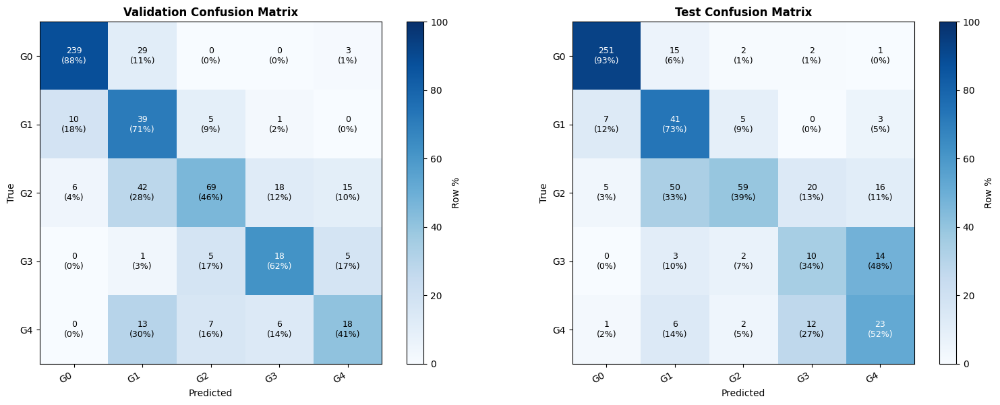


==================================================  Validation Set  ==================================================
  Accuracy        : 69.76%
  QWK             : 0.7756
  OvR AUROC (mac) : 0.8889
  Binary AUROC    : 0.9297
  Sensitivity     : 0.8072
  Specificity     : 0.9509

==================================================  Test Set  ==================================================
  Accuracy        : 69.82%
  QWK             : 0.8103
  OvR AUROC (mac) : 0.8990
  Binary AUROC    : 0.9304
  Sensitivity     : 0.7623
  Specificity     : 0.9511

✅ Metrics saved.


In [19]:
# Load the best checkpoint and evaluate on validation and test sets.
# Generates confusion matrix, ROC / PR curves, and a comprehensive metrics table.

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, precision_recall_curve

ckpt = torch.load(BEST_CKPT, map_location=DEVICE, weights_only=False)
model.load_state_dict(ckpt["model_state"])
model.eval()
print(f"✅ Loaded best checkpoint (epoch {ckpt['epoch']}, val_loss {ckpt['val_loss']:.4f})")

def get_predictions(loader):
    all_logits, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in tqdm(loader, desc="Evaluating"):
            logits = model(imgs.to(DEVICE))
            all_logits.append(logits.cpu())
            all_labels.extend(labels.numpy())
    logits_cat = torch.cat(all_logits, 0)
    probs_cat  = F.softmax(logits_cat, dim=1).numpy()
    preds_cat  = logits_cat.argmax(1).numpy()
    return probs_cat, preds_cat, np.array(all_labels)

print("\n── Validation set ──")
va_probs, va_preds, va_labels = get_predictions(val_loader)
print("── Test set ──")
te_probs, te_preds, te_labels = get_predictions(test_loader)

# ── Confusion matrices ───────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, (name, labels, preds) in zip(axes, [
    ("Validation", va_labels, va_preds),
    ("Test",       te_labels, te_preds),
]):
    cm = confusion_matrix(labels, preds)
    cm_pct = cm.astype(float) / cm.sum(axis=1, keepdims=True) * 100
    im = ax.imshow(cm_pct, cmap="Blues", vmin=0, vmax=100)
    ax.set_xticks(range(5)); ax.set_yticks(range(5))
    ax.set_xticklabels([f"G{i}" for i in range(5)], rotation=30, ha="right")
    ax.set_yticklabels([f"G{i}" for i in range(5)])
    for i in range(5):
        for j in range(5):
            ax.text(j, i, f"{cm[i,j]}\n({cm_pct[i,j]:.0f}%)",
                    ha="center", va="center",
                    color="white" if cm_pct[i, j] > 50 else "black", fontsize=9)
    ax.set_xlabel("Predicted"); ax.set_ylabel("True")
    ax.set_title(f"{name} Confusion Matrix", fontweight="bold")
    plt.colorbar(im, ax=ax, label="Row %")
plt.tight_layout()
plt.savefig(str(ARTIFACT_DIR / "confusion_matrix.png"), dpi=150, bbox_inches="tight")
plt.show()

# ── Metrics ──────────────────────────────────────────────────────────────────
def compute_metrics(labels, probs, preds, split=""):
    n_cls = probs.shape[1]
    y_bin = label_binarize(labels, classes=list(range(n_cls)))
    auroc = roc_auc_score(y_bin, probs, multi_class="ovr", average="macro")
    auprc = average_precision_score(y_bin, probs, average="macro")
    qwk   = qwk_score(labels, preds)
    acc   = (labels == preds).mean()
    bin_true  = (labels >= 2).astype(int)
    bin_prob  = probs[:, 2:].sum(axis=1)
    bin_auroc = roc_auc_score(bin_true, bin_prob)
    bin_auprc = average_precision_score(bin_true, bin_prob)
    best_t, best_diff = 0.5, 1e9
    for t in np.linspace(0, 1, 1001):
        yhat = (bin_prob >= t).astype(int)
        tn, fp, fn, tp = confusion_matrix(bin_true, yhat).ravel()
        d = abs(tn / (tn + fp + 1e-9) - 0.95)
        if d < best_diff:
            best_t, best_diff = t, d
    yhat_opt = (bin_prob >= best_t).astype(int)
    tn, fp, fn, tp = confusion_matrix(bin_true, yhat_opt).ravel()
    spec = tn / (tn + fp + 1e-9)
    sens = tp / (tp + fn + 1e-9)
    print(f"\n{'='*50}  {split} Set  {'='*50}")
    print(f"  Accuracy        : {acc*100:.2f}%")
    print(f"  QWK             : {qwk:.4f}")
    print(f"  OvR AUROC (mac) : {auroc:.4f}")
    print(f"  Binary AUROC    : {bin_auroc:.4f}")
    print(f"  Sensitivity     : {sens:.4f}")
    print(f"  Specificity     : {spec:.4f}")
    return dict(split=split, acc=acc, qwk=qwk, auroc=auroc, auprc=auprc,
                bin_auroc=bin_auroc, bin_auprc=bin_auprc,
                threshold=best_t, spec=spec, sens=sens)

val_metrics  = compute_metrics(va_labels, va_probs, va_preds, "Validation")
test_metrics = compute_metrics(te_labels, te_probs, te_preds, "Test")

pd.DataFrame([val_metrics, test_metrics]).to_csv(
    str(ARTIFACT_DIR / "metrics_summary.csv"), index=False)
print("\n✅ Metrics saved.")


## 💾 Step 17 — Save Final Model

In [20]:
# Save the final model with full metadata for later inference or transfer learning.

FINAL_CKPT = ARTIFACT_DIR / "dr_classifier_final.pt"

torch.save({
    "model_state":  model.state_dict(),
    "backbone":     "efficientnet_b0",
    "num_classes":  NUM_CLASSES,
    "img_size":     IMG_SIZE,
    "grade_map":    GRADE_MAP,
    "val_metrics":  val_metrics,
    "test_metrics": test_metrics,
    "history":      history,
    "seed":         SEED,
    "device":       str(DEVICE),
}, FINAL_CKPT)

print(f"✅ Model saved : {FINAL_CKPT}")
print(f"   File size   : {FINAL_CKPT.stat().st_size / 1e6:.1f} MB")
print()
print("To load on another machine:")
print("  ckpt = torch.load('dr_classifier_final.pt', map_location='cpu', weights_only=False)")
print("  model.load_state_dict(ckpt['model_state'])")


✅ Model saved : /root/dr_grading/artifacts/dr_classifier_final.pt
   File size   : 17.7 MB

To load on another machine:
  ckpt = torch.load('dr_classifier_final.pt', map_location='cpu', weights_only=False)
  model.load_state_dict(ckpt['model_state'])


## ✅ Step 18 — Multi-Layer Fundus Image Validation

The validator applies **six independent checks** in order. Each check targets a different failure mode:

| Layer | Check | Rationale |
|---|---|---|
| 1 | Format & size | Reject non-image files and excessively small/large uploads |
| 2 | Darkness | All-black images are not fundus photos |
| 3 | Circular mask coverage | Fundus images contain a large, roughly circular bright region |
| 4 | Red-channel dominance | Retinal fundus images are predominantly red/orange due to blood vessels and the choroid |
| 5 | Green-channel contrast | The green channel shows the highest vessel/lesion contrast in fundus images |
| 6 | Radial symmetry | The illuminated disc is centred and radially symmetric — not a bar, logo, or other shape |

Validation is intentionally **lenient on cropping**: the circular-disc check uses the *largest* contour and allows as little as 20 % coverage so that partially cropped fundus images are still accepted.


In [21]:
# Multi-layer fundus image validation.
# Returns (is_valid, message, pil_image).

SUPPORTED_FORMATS = {".png", ".jpg", ".jpeg", ".bmp", ".tiff", ".tif"}
MAX_FILE_SIZE_MB  = 20.0
MIN_DIM_PX        = 64
MAX_DIM_PX        = 8192


def _check_circular_fundus_disc(arr_rgb):
    """
    Layer 3: Detect a large, roughly circular bright region (the fundus disc).
    Fundus cameras illuminate the retina as a circle. Even cropped images
    should contain a significant portion of that arc.
    Returns (passed: bool, coverage: float, circularity: float)
    """
    gray = cv2.cvtColor(arr_rgb, cv2.COLOR_RGB2GRAY)
    h, w = gray.shape
    total_px = h * w

    # Threshold to find the bright foreground disc
    blurred = cv2.GaussianBlur(gray, (15, 15), 0)
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, np.ones((25, 25), np.uint8))
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN,  np.ones((15, 15), np.uint8))

    cnts, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return False, 0.0, 0.0

    largest = max(cnts, key=cv2.contourArea)
    area    = cv2.contourArea(largest)
    perim   = cv2.arcLength(largest, True)
    coverage   = area / total_px
    circularity = (4 * np.pi * area / (perim ** 2 + 1e-6)) if perim > 0 else 0.0

    # Accept if disc covers ≥20% of the image AND is somewhat circular (≥0.35)
    # Cropped images may show < half the disc, so 0.20 threshold is intentionally lenient
    return (coverage >= 0.20 and circularity >= 0.35), coverage, circularity


def _check_red_channel_dominance(arr_rgb):
    """
    Layer 4: Verify red-channel dominance typical of fundus photos.
    The retina appears red/orange because of oxygenated haemoglobin and the choroid.
    Returns (passed: bool, r_mean: float, g_mean: float, b_mean: float)
    """
    # Ignore very dark border pixels (< 15 intensity) to avoid black padding bias
    mask = arr_rgb.max(axis=2) > 15
    if mask.sum() < 100:
        return False, 0, 0, 0
    r = float(arr_rgb[:, :, 0][mask].mean())
    g = float(arr_rgb[:, :, 1][mask].mean())
    b = float(arr_rgb[:, :, 2][mask].mean())
    # Red must be the dominant channel AND significantly brighter than blue
    return (r >= g and r >= b and (r - b) >= 8), r, g, b


def _check_green_channel_contrast(arr_rgb):
    """
    Layer 5: Check that the green channel has meaningful contrast (vessels, lesions).
    Low contrast in green channel indicates a non-fundus image (e.g. solid colour).
    Returns (passed: bool, std_dev: float)
    """
    g_channel = arr_rgb[:, :, 1].astype(float)
    # Only evaluate non-black pixels
    active = g_channel[g_channel > 10]
    if len(active) < 500:
        return False, 0.0
    std = float(active.std())
    return std >= 12.0, std  # Typical fundus images: std 18–45; non-fundus often < 10


def _check_radial_symmetry(arr_rgb):
    """
    Layer 6: Check that the bright region is centred and radially symmetric.
    A bar chart, selfie, or document would fail this test.
    Returns (passed: bool, symmetry_score: float)
    """
    gray = cv2.cvtColor(arr_rgb, cv2.COLOR_RGB2GRAY)
    h, w = gray.shape
    cx, cy = w // 2, h // 2

    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    cnts, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return False, 0.0

    largest = max(cnts, key=cv2.contourArea)
    (mx, my), radius = cv2.minEnclosingCircle(largest)

    # How far is the mass centre from the image centre (relative to image diagonal)?
    diag = np.sqrt(h**2 + w**2)
    centre_offset = np.sqrt((mx - cx)**2 + (my - cy)**2) / diag

    # Ellipse eccentricity — a circle has eccentricity 0
    if len(largest) >= 5:
        ellipse = cv2.fitEllipse(largest)
        ma, mi  = max(ellipse[1]), min(ellipse[1])
        eccentricity = np.sqrt(1 - (mi / (ma + 1e-6)) ** 2)
    else:
        eccentricity = 1.0

    symmetry_score = 1.0 - 0.5 * centre_offset - 0.5 * eccentricity
    # Allow partial-crop offset (cropped images shift the disc centroid)
    return (symmetry_score >= 0.25 or centre_offset <= 0.45), symmetry_score


def validate_fundus_image(file_input, strict=False):
    """
    Multi-layer fundus image validator.

    Parameters
    ----------
    file_input : str | Path | bytes | PIL.Image | np.ndarray
    strict     : bool — if True, all 6 layers must pass;
                         if False (default), 4 of 6 layers must pass (tolerant of cropping)

    Returns
    -------
    is_valid   : bool
    message    : str   — human-readable summary
    pil_image  : PIL.Image | None
    details    : dict  — per-layer diagnostic values
    """
    details = {}
    pil_img = None

    # ── Layer 1: Format & file size ──────────────────────────────────────────
    try:
        if isinstance(file_input, (bytes, bytearray)):
            size_mb = len(file_input) / 1e6
            pil_img = Image.open(io.BytesIO(file_input)).convert("RGB")
        elif isinstance(file_input, Image.Image):
            pil_img = file_input.convert("RGB")
            size_mb = 0.0
        elif isinstance(file_input, np.ndarray):
            pil_img = Image.fromarray(
                file_input if file_input.dtype == np.uint8
                else (file_input * 255).clip(0, 255).astype(np.uint8)
            ).convert("RGB")
            size_mb = 0.0
        else:
            p = Path(file_input)
            ext = p.suffix.lower()
            if ext not in SUPPORTED_FORMATS:
                return False, f"❌ Unsupported format '{ext}'. Use PNG, JPG, BMP, or TIFF.", None, {}
            size_mb = p.stat().st_size / 1e6
            if size_mb > MAX_FILE_SIZE_MB:
                return False, f"❌ File too large ({size_mb:.1f} MB > {MAX_FILE_SIZE_MB} MB limit).", None, {}
            pil_img = Image.open(p).convert("RGB")
    except Exception as e:
        return False, f"❌ Cannot read image: {e}", None, {}

    w, h = pil_img.size
    if w < MIN_DIM_PX or h < MIN_DIM_PX:
        return False, f"❌ Image too small ({w}×{h} px). Minimum: {MIN_DIM_PX}px.", None, {}
    if w > MAX_DIM_PX or h > MAX_DIM_PX:
        return False, f"❌ Image too large ({w}×{h} px). Maximum: {MAX_DIM_PX}px.", None, {}

    details["size_mb"] = round(size_mb, 2)
    details["width"]   = w
    details["height"]  = h

    arr = np.array(pil_img)  # uint8 RGB

    # ── Layer 2: Darkness check ──────────────────────────────────────────────
    mean_brightness = float(arr.mean())
    details["mean_brightness"] = round(mean_brightness, 1)
    if mean_brightness < 8.0:
        return False, "❌ Image is effectively black — not a fundus photo.", pil_img, details

    # ── Layer 3: Circular disc ───────────────────────────────────────────────
    disc_ok, coverage, circularity = _check_circular_fundus_disc(arr)
    details["disc_coverage"]   = round(coverage, 3)
    details["disc_circularity"] = round(circularity, 3)

    # ── Layer 4: Red-channel dominance ───────────────────────────────────────
    red_ok, r_mean, g_mean, b_mean = _check_red_channel_dominance(arr)
    details["r_mean"] = round(r_mean, 1)
    details["g_mean"] = round(g_mean, 1)
    details["b_mean"] = round(b_mean, 1)

    # ── Layer 5: Green-channel contrast ──────────────────────────────────────
    contrast_ok, g_std = _check_green_channel_contrast(arr)
    details["g_std"] = round(g_std, 1)

    # ── Layer 6: Radial symmetry ─────────────────────────────────────────────
    sym_ok, sym_score = _check_radial_symmetry(arr)
    details["symmetry_score"] = round(sym_score, 3)

    # ── Decision ─────────────────────────────────────────────────────────────
    layer_results = [disc_ok, red_ok, contrast_ok, sym_ok]
    n_passed      = sum(layer_results)
    threshold     = 4 if strict else 3   # require 4/4 in strict, 3/4 otherwise

    layer_labels = [
        f"Circular disc (cov={coverage:.2f}, circ={circularity:.2f})",
        f"Red dominance (R={r_mean:.0f} G={g_mean:.0f} B={b_mean:.0f})",
        f"Green contrast (std={g_std:.1f})",
        f"Radial symmetry (score={sym_score:.2f})",
    ]
    layer_icons = ["✅" if v else "❌" for v in layer_results]
    layer_report = "  |  ".join(f"{icon} {lbl}" for icon, lbl in zip(layer_icons, layer_labels))

    if n_passed >= threshold:
        msg = (f"✅ Valid fundus image ({w}×{h} px) — "
               f"{n_passed}/4 fundus checks passed.\n   {layer_report}")
        return True, msg, pil_img, details
    else:
        failed_layers = [lbl for ok, lbl in zip(layer_results, layer_labels) if not ok]
        msg = (f"❌ Not a valid fundus image — only {n_passed}/4 checks passed.\n"
               f"   Failed: {', '.join(failed_layers)}\n   {layer_report}")
        return False, msg, pil_img, details


# ── Quick self-test on one training image ─────────────────────────────────
test_path = df_te["image_path"].iloc[0]
valid, msg, pil_img, details = validate_fundus_image(test_path)
print(f"Test image : {Path(test_path).name}")
print(f"Result     : {msg}")
print(f"Details    : {details}")


Test image : 89ee1fa16f90.png
Result     : ✅ Valid fundus image (2416×1736 px) — 4/4 fundus checks passed.
   ✅ Circular disc (cov=0.83, circ=0.86)  |  ✅ Red dominance (R=222 G=146 B=26)  |  ✅ Green contrast (std=13.4)  |  ✅ Radial symmetry (score=0.89)
Details    : {'size_mb': 1.91, 'width': 2416, 'height': 1736, 'mean_brightness': 109.9, 'disc_coverage': 0.832, 'disc_circularity': 0.858, 'r_mean': 221.6, 'g_mean': 145.7, 'b_mean': 25.9, 'g_std': 13.4, 'symmetry_score': np.float64(0.893)}


## 🔮 Step 19 — Prediction Function

In [22]:
# Prediction wrapper: validates input → preprocesses → runs inference → returns grade & probabilities.

def predict(image_input, top_k=5):
    """
    Predict the DR grade from a fundus image.

    Parameters
    ----------
    image_input : str | Path | PIL.Image | np.ndarray
    top_k       : number of top class probabilities to include in output

    Returns
    -------
    dict with keys: grade, grade_label, confidence, probabilities, preprocessed_img
    """
    model.eval()
    tmp_path = str(PROJECT_DIR / "_tmp_input.png")

    if isinstance(image_input, (str, Path)):
        valid, msg, pil_img, _ = validate_fundus_image(image_input)
        if not valid or pil_img is None:
            raise ValueError(msg)
        arr = np.array(pil_img)
        cv2.imwrite(tmp_path, cv2.cvtColor(arr, cv2.COLOR_RGB2BGR))
        preprocessed = preprocess_fundus(tmp_path)
    elif isinstance(image_input, Image.Image):
        arr = np.array(image_input.convert("RGB"))
        cv2.imwrite(tmp_path, cv2.cvtColor(arr, cv2.COLOR_RGB2BGR))
        preprocessed = preprocess_fundus(tmp_path)
    elif isinstance(image_input, np.ndarray):
        if image_input.dtype != np.uint8:
            image_input = (image_input * 255).clip(0, 255).astype(np.uint8)
        bgr = cv2.cvtColor(image_input, cv2.COLOR_RGB2BGR)
        cv2.imwrite(tmp_path, bgr)
        preprocessed = preprocess_fundus(tmp_path)
    else:
        raise TypeError(f"Unsupported input type: {type(image_input)}")

    if preprocessed is None:
        raise ValueError("Preprocessing failed — invalid or unreadable image.")

    tensor = val_test_transforms(image=preprocessed)["image"].unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        probs = F.softmax(model(tensor), dim=1)[0].cpu().numpy()

    grade      = int(probs.argmax())
    confidence = float(probs[grade])

    return {
        "grade":            grade,
        "grade_label":      GRADE_MAP[grade],
        "confidence":       confidence,
        "probabilities":    {GRADE_MAP[i]: float(probs[i]) for i in range(NUM_CLASSES)},
        "preprocessed_img": preprocessed,
    }


# ── Test on 5 samples ────────────────────────────────────────────────────────
print("🔍 Testing prediction on 5 test-set samples:")
for i in range(5):
    row    = df_te.iloc[i]
    result = predict(row["image_path"])
    ok     = "✅" if result["grade"] == row["diagnosis"] else "❌"
    print(f"  {ok} True: G{row['diagnosis']} | Pred: G{result['grade']} "
          f"({result['confidence']*100:.1f}%) | {result['grade_label']}")


🔍 Testing prediction on 5 test-set samples:
  ❌ True: G2 | Pred: G4 (37.6%) | Proliferative DR (PDR)
  ✅ True: G2 | Pred: G2 (43.0%) | Moderate DR
  ✅ True: G1 | Pred: G1 (47.1%) | Mild DR
  ❌ True: G2 | Pred: G1 (60.1%) | Mild DR
  ✅ True: G0 | Pred: G0 (71.5%) | No DR


## 🗺️ Step 20 — Explainability with Grad-CAM++

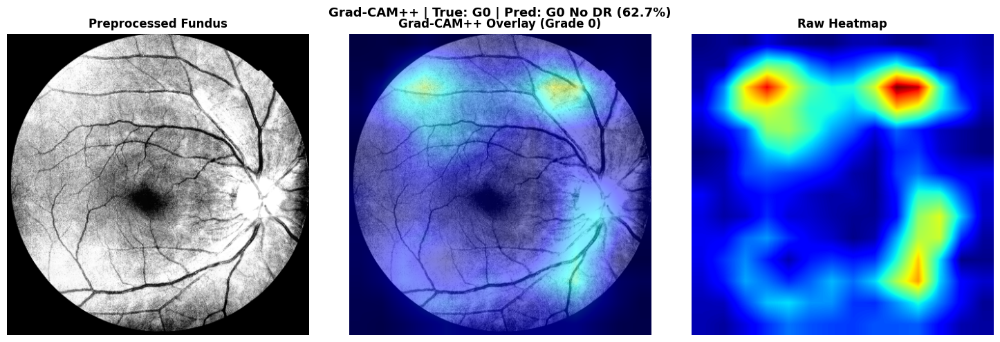

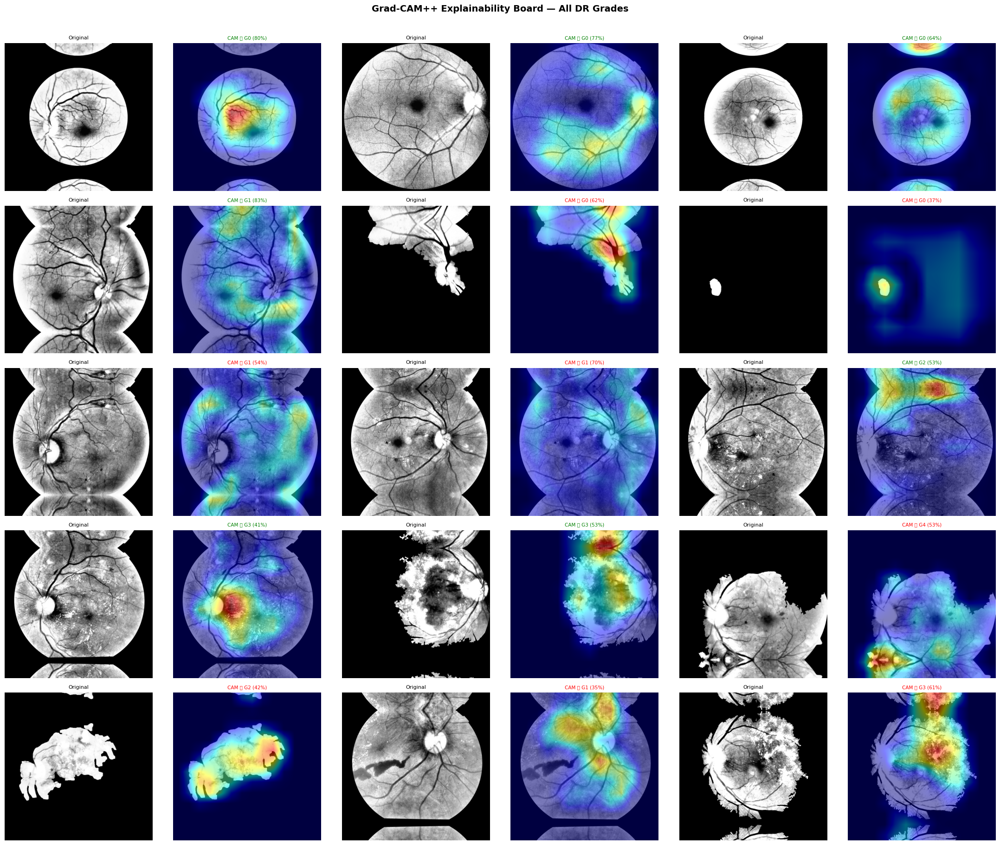

✅ Grad-CAM++ board saved.


In [23]:
# Generate Grad-CAM++ heatmaps to highlight the retinal regions that drove each prediction.
# Also builds the full 5-grade explainability board.

from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

def generate_gradcam(image_input, target_class=None):
    """
    Generate a Grad-CAM++ heatmap overlay for a fundus image.

    Returns (original_rgb, overlay_rgb, heatmap, result_dict)
    """
    result      = predict(image_input)
    tc          = target_class if target_class is not None else result["grade"]
    preprocessed = result["preprocessed_img"]
    tensor      = val_test_transforms(image=preprocessed)["image"].unsqueeze(0).to(DEVICE)

    target_layer = [model.get_cam_target_layer()]
    with GradCAMPlusPlus(model=model, target_layers=target_layer) as cam:
        grayscale_cam = cam(
            input_tensor=tensor,
            targets=[ClassifierOutputTarget(tc)],
            eigen_smooth=True,
            aug_smooth=True
        )[0]

    orig_float = preprocessed.astype(np.float32) / 255.0
    overlay    = show_cam_on_image(orig_float, grayscale_cam, use_rgb=True, image_weight=0.5)
    return preprocessed, overlay, grayscale_cam, result


# ── Single sample test ────────────────────────────────────────────────────────
sample_path = df_va.iloc[5]["image_path"]
orig, overlay, heatmap, result = generate_gradcam(sample_path)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(orig);            axes[0].set_title("Preprocessed Fundus", fontweight="bold")
axes[1].imshow(overlay);         axes[1].set_title(f"Grad-CAM++ Overlay (Grade {result['grade']})", fontweight="bold")
axes[2].imshow(heatmap, cmap="jet"); axes[2].set_title("Raw Heatmap", fontweight="bold")
for ax in axes: ax.axis("off")
plt.suptitle(f"Grad-CAM++ | True: G{df_va.iloc[5]['diagnosis']} | "
             f"Pred: G{result['grade']} {result['grade_label']} "
             f"({result['confidence']*100:.1f}%)",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig(str(ARTIFACT_DIR / "sample_gradcam.png"), dpi=150, bbox_inches="tight")
plt.show()

# ── Grad-CAM board: 3 samples per grade ──────────────────────────────────────
fig, axes = plt.subplots(5, 6, figsize=(22, 18))
for grade in range(5):
    samples = df_va[df_va["diagnosis"] == grade].head(3)
    for j, (_, row) in enumerate(samples.iterrows()):
        orig, overlay, _, res = generate_gradcam(row["image_path"])
        ok = "✅" if res["grade"] == grade else "❌"
        axes[grade][j*2].imshow(orig);     axes[grade][j*2].axis("off")
        axes[grade][j*2].set_title("Original", fontsize=8)
        axes[grade][j*2+1].imshow(overlay); axes[grade][j*2+1].axis("off")
        axes[grade][j*2+1].set_title(
            f"CAM {ok} G{res['grade']} ({res['confidence']*100:.0f}%)",
            fontsize=7.5, color="green" if res["grade"] == grade else "red")
    axes[grade][0].set_ylabel(f"G{grade}\n{GRADE_MAP[grade]}",
                               fontsize=9, fontweight="bold", color=GRADE_COLORS[grade],
                               rotation=0, labelpad=85, va="center")
plt.suptitle("Grad-CAM++ Explainability Board — All DR Grades",
             fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(str(ARTIFACT_DIR / "gradcam_board.png"), dpi=120, bbox_inches="tight")
plt.show()
print("✅ Grad-CAM++ board saved.")


## 🚀 Step 21 — Streamlit Web App + ngrok Public Deployment

This step:
1. Writes the full Streamlit application to `dr_app.py`
2. Launches Streamlit on port 8501
3. Exposes the app publicly via **ngrok** — no server required

The interface provides:
- **Image upload** with the 6-layer fundus validator
- **Real-time DR grade prediction** with confidence score
- **Grad-CAM++ overlay** showing which retinal regions drove the decision
- **Probability bar chart** for all 5 grades
- **Severity card** with clinical action guidance

> ⚠️ Get a free ngrok auth token at https://dashboard.ngrok.com/get-started/your-authtoken then run `ngrok config add-authtoken <YOUR_TOKEN>` or set the `NGROK_AUTHTOKEN` variable below.


In [26]:
APP_PATH = PROJECT_DIR / "dr_app.py"
MODEL_PATH = str(FINAL_CKPT)

app_code = f'''
import os, io, sys, warnings
warnings.filterwarnings("ignore")
from pathlib import Path

import numpy as np
import cv2
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
import streamlit as st

# ── Constants ────────────────────────────────────────────────────────────────
IMG_SIZE    = {IMG_SIZE}
NUM_CLASSES = {NUM_CLASSES}
GRADE_MAP   = {GRADE_MAP}
GRADE_COLORS = {GRADE_COLORS}
MODEL_PATH  = r"{MODEL_PATH}"
SUPPORTED_FORMATS = {{".png", ".jpg", ".jpeg", ".bmp", ".tiff", ".tif"}}
MAX_FILE_SIZE_MB  = 20.0
MIN_DIM_PX        = 64
MAX_DIM_PX        = 8192

SEVERITY_INFO = {{
    0: {{"emoji": "🟢", "color": "#2ecc71", "label": "No DR",
         "detail": "No signs of diabetic retinopathy detected.",
         "action": "Routine annual follow-up recommended."}},
    1: {{"emoji": "🟡", "color": "#f1c40f", "label": "Mild DR",
         "detail": "Microaneurysms only. Early stage retinopathy.",
         "action": "Refer to ophthalmologist within 12 months."}},
    2: {{"emoji": "🟠", "color": "#e67e22", "label": "Moderate DR",
         "detail": "More than microaneurysms; possible exudates / haemorrhages.",
         "action": "Refer within 3-6 months. ⚠️ REFERABLE"}},
    3: {{"emoji": "🔴", "color": "#e74c3c", "label": "Severe DR",
         "detail": "Extensive haemorrhages, venous beading, IRMA.",
         "action": "Urgent referral within 4 weeks. 🚨 HIGH RISK"}},
    4: {{"emoji": "🟣", "color": "#8e44ad", "label": "Proliferative DR (PDR)",
         "detail": "Neovascularization, vitreous haemorrhage or TRD present.",
         "action": "Emergency referral. Immediate consultation required. 🆘 CRITICAL"}},
}}

# ── Preprocessing helpers ─────────────────────────────────────────────────────
def ben_graham(img_rgb, sigma_ratio=0.3):
    sigma = int(img_rgb.shape[0] * sigma_ratio)
    if sigma % 2 == 0: sigma += 1
    blurred = cv2.GaussianBlur(img_rgb, (0, 0), sigmaX=sigma)
    return cv2.addWeighted(img_rgb, 4, blurred, -4, 128)

def make_retina_mask(rgb):
    g = rgb[:, :, 1]
    g_blur = cv2.medianBlur(g, 9)
    _, th = cv2.threshold(g_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    th = cv2.morphologyEx(th, cv2.MORPH_OPEN, np.ones((9, 9), np.uint8))
    cnts, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return np.ones(g.shape, np.uint8) * 255
    c = max(cnts, key=cv2.contourArea)
    mask = np.zeros_like(g, np.uint8)
    cv2.drawContours(mask, [c], -1, 255, -1)
    (x, y), r = cv2.minEnclosingCircle(c)
    circ = np.zeros_like(g, np.uint8)
    cv2.circle(circ, (int(x), int(y)), int(r * 0.97), 255, -1)
    return cv2.bitwise_and(mask, circ)

def apply_clahe(rgb):
    lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l2 = clahe.apply(l)
    return cv2.cvtColor(cv2.merge([l2, a, b]), cv2.COLOR_LAB2RGB)

def emphasize_green(rgb):
    r, g, b = cv2.split(rgb)
    mix = cv2.addWeighted(r, 0.1, g, 0.8, 0)
    mix = cv2.addWeighted(mix, 1.0, b, 0.1, 0)
    return cv2.merge([mix, mix, mix])

def resize_pad_square(rgb, size=IMG_SIZE):
    h, w = rgb.shape[:2]; s = size / max(h, w)
    nh, nw = int(round(h * s)), int(round(w * s))
    img = cv2.resize(rgb, (nw, nh), interpolation=cv2.INTER_AREA)
    pt = (size - nh) // 2; pb = size - nh - pt
    pl = (size - nw) // 2; pr = size - nw - pl
    return cv2.copyMakeBorder(img, pt, pb, pl, pr, cv2.BORDER_REFLECT_101)

def preprocess_fundus(arr_rgb, size=IMG_SIZE):
    rgb = arr_rgb.copy()
    mask = make_retina_mask(rgb); rgb[mask == 0] = 0
    rgb = apply_clahe(rgb)
    rgb = ben_graham(rgb)
    mask2 = make_retina_mask(rgb); rgb[mask2 == 0] = 0
    rgb = emphasize_green(rgb)
    return resize_pad_square(rgb, size)

# ── Validation ────────────────────────────────────────────────────────────────
def _check_circular_fundus_disc(arr_rgb):
    gray = cv2.cvtColor(arr_rgb, cv2.COLOR_RGB2GRAY)
    h, w = gray.shape; total_px = h * w
    blurred = cv2.GaussianBlur(gray, (15, 15), 0)
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, np.ones((25, 25), np.uint8))
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN,  np.ones((15, 15), np.uint8))
    cnts, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts: return False, 0.0, 0.0
    largest = max(cnts, key=cv2.contourArea)
    area = cv2.contourArea(largest); perim = cv2.arcLength(largest, True)
    coverage = area / total_px
    circularity = (4 * np.pi * area / (perim ** 2 + 1e-6)) if perim > 0 else 0.0
    return (coverage >= 0.20 and circularity >= 0.35), coverage, circularity

def _check_red_channel_dominance(arr_rgb):
    mask = arr_rgb.max(axis=2) > 15
    if mask.sum() < 100: return False, 0, 0, 0
    r = float(arr_rgb[:, :, 0][mask].mean())
    g = float(arr_rgb[:, :, 1][mask].mean())
    b = float(arr_rgb[:, :, 2][mask].mean())
    return (r >= g and r >= b and (r - b) >= 8), r, g, b

def _check_green_channel_contrast(arr_rgb):
    g_channel = arr_rgb[:, :, 1].astype(float)
    active = g_channel[g_channel > 10]
    if len(active) < 500: return False, 0.0
    std = float(active.std())
    return std >= 12.0, std

def _check_radial_symmetry(arr_rgb):
    gray = cv2.cvtColor(arr_rgb, cv2.COLOR_RGB2GRAY)
    h, w = gray.shape; cx, cy = w // 2, h // 2
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    cnts, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts: return False, 0.0
    largest = max(cnts, key=cv2.contourArea)
    (mx, my), _ = cv2.minEnclosingCircle(largest)
    diag = np.sqrt(h**2 + w**2)
    centre_offset = np.sqrt((mx - cx)**2 + (my - cy)**2) / diag
    if len(largest) >= 5:
        ellipse = cv2.fitEllipse(largest)
        ma, mi  = max(ellipse[1]), min(ellipse[1])
        eccentricity = np.sqrt(1 - (mi / (ma + 1e-6)) ** 2)
    else:
        eccentricity = 1.0
    symmetry_score = 1.0 - 0.5 * centre_offset - 0.5 * eccentricity
    return (symmetry_score >= 0.25 or centre_offset <= 0.45), symmetry_score

def validate_fundus_image(pil_img):
    arr = np.array(pil_img.convert("RGB"))
    w, h = pil_img.size
    if w < MIN_DIM_PX or h < MIN_DIM_PX:
        return False, f"❌ Image too small ({{w}}x{{h}} px)."
    if arr.mean() < 8.0:
        return False, "❌ Image is effectively black — not a fundus photo."
    disc_ok, cov, circ = _check_circular_fundus_disc(arr)
    red_ok, r, g, b    = _check_red_channel_dominance(arr)
    ctr_ok, g_std      = _check_green_channel_contrast(arr)
    sym_ok, sym_score  = _check_radial_symmetry(arr)
    n_passed = sum([disc_ok, red_ok, ctr_ok, sym_ok])
    layer_icons = ["✅" if v else "❌" for v in [disc_ok, red_ok, ctr_ok, sym_ok]]
    layer_labels = [
        f"Circular disc (cov={{cov:.2f}}, circ={{circ:.2f}})",
        f"Red dominance (R={{r:.0f}} G={{g:.0f}} B={{b:.0f}})",
        f"Green contrast (std={{g_std:.1f}})",
        f"Radial symmetry (score={{sym_score:.2f}})",
    ]
    report = "  \\n".join(f"{{ic}} {{lb}}" for ic, lb in zip(layer_icons, layer_labels))
    if n_passed >= 3:
        return True, f"✅ Valid fundus image ({{n_passed}}/4 checks passed)\\n" + report
    else:
        failed = [lb for ok, lb in zip([disc_ok, red_ok, ctr_ok, sym_ok], layer_labels) if not ok]
        return False, f"❌ Not a valid fundus image (only {{n_passed}}/4 checks passed).\\nFailed: {{', '.join(failed)}}\\n" + report

# ── Model ────────────────────────────────────────────────────────────────────
class DRClassifier(nn.Module):
    def __init__(self, num_classes=5, dropout=0.4):
        super().__init__()
        self.backbone = timm.create_model("efficientnet_b0", pretrained=False,
                                          num_classes=0, global_pool="avg")
        feat_dim = self.backbone.num_features
        self.head = nn.Sequential(
            nn.BatchNorm1d(feat_dim), nn.Dropout(dropout),
            nn.Linear(feat_dim, 256), nn.SiLU(),
            nn.BatchNorm1d(256), nn.Dropout(dropout / 2),
            nn.Linear(256, num_classes),
        )
    def forward(self, x): return self.head(self.backbone(x))
    def get_cam_target_layer(self): return self.backbone.conv_head

if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
else:
    DEVICE = torch.device("cpu")

@st.cache_resource
def load_model():
    m = DRClassifier(num_classes=NUM_CLASSES).to(DEVICE)
    ckpt = torch.load(MODEL_PATH, map_location=DEVICE, weights_only=False)
    m.load_state_dict(ckpt["model_state"])
    m.eval()
    return m

tfm = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

def run_inference(arr_rgb, model):
    preprocessed = preprocess_fundus(arr_rgb)
    tensor = tfm(image=preprocessed)["image"].unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        probs = F.softmax(model(tensor), dim=1)[0].cpu().numpy()
    grade = int(probs.argmax())
    return grade, float(probs[grade]), probs, preprocessed

def run_gradcam(arr_rgb, model, grade):
    preprocessed = preprocess_fundus(arr_rgb)
    tensor = tfm(image=preprocessed)["image"].unsqueeze(0).to(DEVICE)
    with GradCAMPlusPlus(model=model, target_layers=[model.get_cam_target_layer()]) as cam:
        gcam = cam(input_tensor=tensor, targets=[ClassifierOutputTarget(grade)],
                   eigen_smooth=True, aug_smooth=True)[0]
    overlay = show_cam_on_image(preprocessed.astype(np.float32)/255.0, gcam,
                                use_rgb=True, image_weight=0.5)
    return preprocessed, overlay

def make_prob_chart(probs):
    fig, ax = plt.subplots(figsize=(7, 3.0))
    grades = [GRADE_MAP[i] for i in range(NUM_CLASSES)]
    values = [probs[i] * 100 for i in range(NUM_CLASSES)]
    bars = ax.barh(grades, values, color=GRADE_COLORS, edgecolor="white", height=0.55)
    for bar, val in zip(bars, values):
        ax.text(min(val + 1, 96), bar.get_y() + bar.get_height()/2,
                f"{{val:.1f}}%", va="center", ha="left", fontsize=10, fontweight="bold")
    ax.set_xlim(0, 108); ax.set_xlabel("Confidence (%)", fontsize=10)
    ax.set_title("Prediction Confidence by DR Grade", fontsize=11, fontweight="bold")
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="x", alpha=0.3); ax.invert_yaxis()
    plt.tight_layout()
    return fig

# ── Streamlit UI ──────────────────────────────────────────────────────────────
st.set_page_config(page_title="DR Grading System", page_icon="🩺", layout="wide")

st.markdown("""
    <style>
        .main {{max-width: 1200px; margin: auto;}}
        .stAlert {{border-radius: 10px;}}
        .grade-card {{padding: 16px; border-radius: 12px; margin: 8px 0;}}
    </style>
""", unsafe_allow_html=True)

st.title("🩺 AI-Powered Diabetic Retinopathy Grading")
st.caption("EfficientNet-B0 + Grad-CAM++ · APTOS 2019 Dataset")
st.error("⚠️ For research and educational use only — NOT a medical device.")

model = load_model()

col_left, col_right = st.columns([1, 2])

with col_left:
    st.subheader("📤 Upload Fundus Image")
    uploaded = st.file_uploader(
        "Accepts PNG, JPG, BMP, TIFF (max 20 MB)",
        type=["png", "jpg", "jpeg", "bmp", "tiff", "tif"]
    )
    if uploaded:
        file_bytes = uploaded.read()
        pil_img = Image.open(io.BytesIO(file_bytes)).convert("RGB")
        st.image(pil_img, caption="Uploaded image", use_container_width=True)

        is_valid, val_msg = validate_fundus_image(pil_img)
        if is_valid:
            st.success(val_msg)
        else:
            st.error(val_msg)
            st.stop()

with col_right:
    if uploaded and is_valid:
        st.subheader("🔬 Analysis")

        with st.spinner("Running inference + Grad-CAM++..."):
            arr_rgb = np.array(pil_img)
            grade, confidence, probs, preprocessed = run_inference(arr_rgb, model)
            orig_pre, overlay = run_gradcam(arr_rgb, model, grade)

        info = SEVERITY_INFO[grade]
        # ✅ FIX: Pre-assign dict values to plain variables to avoid
        #         backslash-in-f-string-expression SyntaxError
        card_color  = info["color"]
        card_emoji  = info["emoji"]
        card_label  = info["label"]
        card_detail = info["detail"]
        card_action = info["action"]

        st.markdown(f"""
        <div class="grade-card" style="background:{{card_color}}22; border:2px solid {{card_color}};">
            <span style="font-size:2rem;">{{card_emoji}}</span>
            <span style="font-size:1.4rem; font-weight:800; color:{{card_color}};">
            &nbsp; Grade {{grade}} &mdash; {{card_label}}</span><br/>
            <b>Confidence:</b> {{confidence*100:.1f}}%<br/>
            <b>Finding:</b> {{card_detail}}<br/>
            <b>Recommended action:</b> {{card_action}}
        </div>
        """, unsafe_allow_html=True)

        c1, c2 = st.columns(2)
        with c1:
            st.caption("Preprocessed fundus")
            st.image(orig_pre, use_container_width=True)
        with c2:
            st.caption("Grad-CAM++ heatmap overlay")
            st.image(overlay, use_container_width=True)

        st.pyplot(make_prob_chart(probs))
    else:
        st.info("Upload a fundus retinal image on the left to begin.")

st.divider()
st.caption("EfficientNet-B0 · APTOS 2019 · Not a medical device.")
'''

APP_PATH.write_text(app_code)
print(f"✅ Streamlit app written to: {APP_PATH}")

✅ Streamlit app written to: /root/dr_grading/dr_app.py


In [29]:
import subprocess, time, threading, sys
from pyngrok import ngrok, conf

# ── Your ngrok token ───────────────────────────────────────────────────────
NGROK_AUTHTOKEN = "3Bnnvce7UpmBKt6drPWvnGeKNIP_6cSnrtPeywgXBCVomMXud"

# ── Configure ngrok ────────────────────────────────────────────────────────
conf.get_default().auth_token = NGROK_AUTHTOKEN
PORT = 8501

# ── Kill any existing processes ────────────────────────────────────────────
subprocess.run(["pkill", "-f", "streamlit"], capture_output=True)
ngrok.kill()
time.sleep(2)

# ── Start Streamlit in background ──────────────────────────────────────────
def run_streamlit():
    subprocess.run([
        sys.executable, "-m", "streamlit", "run", str(APP_PATH),
        "--server.port", str(PORT),
        "--server.headless", "true",
        "--server.fileWatcherType", "none",
        "--server.enableCORS", "false",
    ])

thread = threading.Thread(target=run_streamlit, daemon=True)
thread.start()

print("⏳ Waiting for Streamlit to start...")
time.sleep(8)

# ── Open ngrok tunnel ──────────────────────────────────────────────────────
tunnel = ngrok.connect(PORT)

print("=" * 60)
print("  🌐  DR Grading App is LIVE!")
print(f"  👉  Public URL : {tunnel.public_url}")
print(f"  👉  Local URL  : http://localhost:{PORT}")
print("=" * 60)
print("  🛑  To stop: ngrok.disconnect(tunnel.public_url)")

⏳ Waiting for Streamlit to start...
  🌐  DR Grading App is LIVE!
  👉  Public URL : https://lilaceous-superdiabolically-jamari.ngrok-free.dev
  👉  Local URL  : http://localhost:8501
  🛑  To stop: ngrok.disconnect(tunnel.public_url)


## 📝 Step 22 — Final Results Summary

In [30]:
# Print a consolidated summary of all results and saved artifacts.

print("=" * 65)
print("  DIABETIC RETINOPATHY GRADING — FINAL RESULTS SUMMARY")
print("=" * 65)

for split, m in [("Validation", val_metrics), ("Test", test_metrics)]:
    print(f"\n  {split} Set:")
    print(f"    Accuracy       : {m['acc']*100:.2f}%")
    print(f"    Quadratic WK   : {m['qwk']:.4f}")
    print(f"    Binary AUROC   : {m['bin_auroc']:.4f}")
    print(f"    Binary AUPRC   : {m['bin_auprc']:.4f}")
    print(f"    Sensitivity    : {m['sens']:.4f}  (@ threshold={m['threshold']:.3f})")
    print(f"    Specificity    : {m['spec']:.4f}")

print("\n  Artifacts saved to:", ARTIFACT_DIR)
for f in sorted(ARTIFACT_DIR.glob("*")):
    print(f"    {f.name:40s}  {f.stat().st_size/1e3:.1f} KB")

print("\n  Model     : EfficientNet-B0 (timm)")
print("  Dataset   : APTOS 2019 Blindness Detection (Kaggle)")
print("  Device    :", DEVICE)
print("  XAI       : Grad-CAM++ (pytorch-grad-cam)")
print("  Interface : Streamlit + ngrok")
print("=" * 65)
print("  ⚠️  RESEARCH USE ONLY — NOT FOR CLINICAL DEPLOYMENT")
print("=" * 65)


  DIABETIC RETINOPATHY GRADING — FINAL RESULTS SUMMARY

  Validation Set:
    Accuracy       : 69.76%
    Quadratic WK   : 0.7756
    Binary AUROC   : 0.9297
    Binary AUPRC   : 0.9221
    Sensitivity    : 0.8072  (@ threshold=0.525)
    Specificity    : 0.9509

  Test Set:
    Accuracy       : 69.82%
    Quadratic WK   : 0.8103
    Binary AUROC   : 0.9304
    Binary AUPRC   : 0.9230
    Sensitivity    : 0.7623  (@ threshold=0.569)
    Specificity    : 0.9511

  Artifacts saved to: /root/dr_grading/artifacts
    augmentation_examples.png                 2948.1 KB
    best_model.pt                             17678.7 KB
    confusion_matrix.png                      131.6 KB
    dr_classifier_final.pt                    17684.0 KB
    eda_distribution.png                      111.8 KB
    gradcam_board.png                         4450.6 KB
    metrics_summary.csv                       0.4 KB
    preprocessing_stages.png                  6778.6 KB
    sample_gradcam.png                  